# IMA 208 TP5: homography estimation

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

In this practical work, we will study how to estimate an homography between two given images. We will consider both the simple DLT algorithm (part I) and the RANSAC algorithm (part II).

To reduce the time you need for this practical work, we will use a few pre-implemented functions of openCV. Make sure that your library installation is correct before starting to work.

# Part 1: homography estimation from hand-selected keypoints: DLT algorithm

We assume that we have an image of a documents suffering from severe perspective distortion. The objective of this part is to warp this image (denoted in the following as img2) to remove the distortion using a reference image beeing in the desired pose (denoted as img1).

The following cell enables to vizualize the images using openCV.

(<Figure size 640x480 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x1c976fdb1a0>)

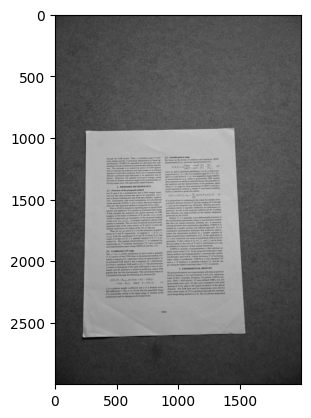

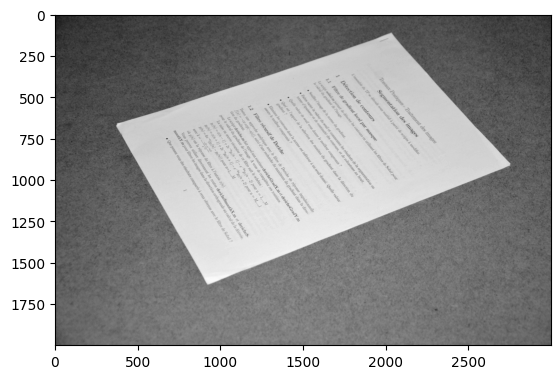

In [2]:
img1 = cv2.cvtColor(cv2.imread('Feuille_redressee.jpg'),cv2.COLOR_BGR2GRAY) # Reference image
img2 = cv2.cvtColor(cv2.imread('Feuille.jpg'),cv2.COLOR_BGR2GRAY) # Image to be processed

plt.figure(),plt.imshow(img1,cmap='gray')
plt.figure(),plt.imshow(img2,cmap='gray')

To correct the homography beetween the to images, we will need some points to match between the two images.

**Question:** how many points do you at least need to estimate the homography? Why?

**Réponse:**

Il faut au moins 4 points pour estimer l'homographie car une homographie a 8 degrés de liberté (car 8 ratios indépendants parmis les 9 coefficients), il faut donc 4 points (qui ont chacun 2 degrés de liberté) dont 3 ne sont pas colinéaires sur un plan.

**Implementation:** to estimate the homography, some matching keypoints between the reference image and the to-be-porcessed one are given below. They here correspond to the corners of the two documents.

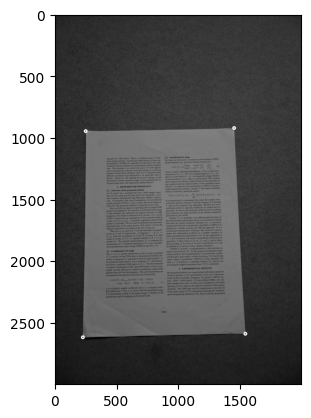

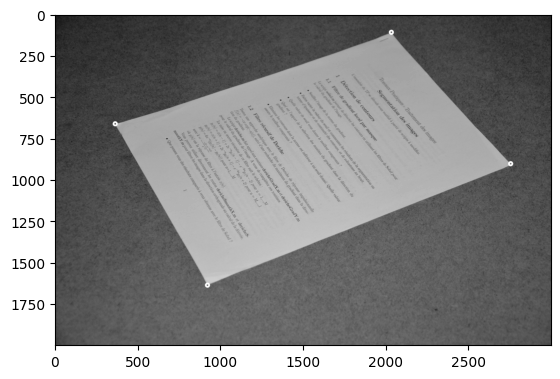

In [3]:
pts1 = [[248,949],[1450,924],[1541,2592],[225,2621]] # Keypoints for img1. Should be a list in format [[first_point_row,first_point_column],[second_point_row,second_point_column],...]
pts2 = [[2030,110],[2750,904],[920,1638],[363,663]] # Keypoints for img2,  keep the same order of the points as pts1.

# Below, we convert the points you found above into cv2 points object for vizualization (no need to change anything)
kp1 = [cv2.KeyPoint(pt[0], pt[1], 1) for pt in pts1]
kp2 = [cv2.KeyPoint(pt[0], pt[1], 1) for pt in pts2]

for i in range(len(pts1)):
    img1c=cv2.circle(img1,pts1[i],radius=10,color=(255,0,0),thickness=10)
plt.figure(),plt.imshow(img1c,cmap='gray')

for i in range(len(pts2)):
    img2c=cv2.circle(img2,pts2[i],radius=10,color=(255,0,0),thickness=10)
plt.figure(),plt.imshow(img2c,cmap='gray')

pts1 = np.array(pts1).T # In all the following, we will use the convention that np.shape(pts1) = [2,number_of_points]
pts2 = np.array(pts2).T # In all the following, we will use the convention that np.shape(pts1) = [2,number_of_points

**Visualize** the keypoints you found above to check that they are properly assigned.

Now, we will start implementing the DLT.

**Question:** recall what the DLT is. Give a pseudo code. What are its potential flaws and strengths?

**Réponse:**

L'algorithme DLT permet d'estimer d'estimer une homographie $H$ qui approxime au mieux la transformation entre des correspondances de points.
Son pseudo code est :

1) Normaliser les 2 sets de données : les centrer en (0,0) et fixer leurs distance moyennes à l'origine à $\sqrt 2$
2) Pour chaque correspondance de points calculer la matrice $A_i$ de la formule (4.1) du cours
3) Faire la décomposition SVD de la matrice $A$ et garder le vecteur singulière unitaire $h$ associé à la plus petite valeur singulière.
4) Modifier la forme du vecteur $h$ pour obtenir la matrice $\tilde{H}$ comme dans la formule (4.2)
5) Dénormaliser la matrice $H = T'^{-1} \tilde{H} T$ 


Ses points forts sont qu'il est extrêment rapide et simple à mettre en oeuvre. Ses points faibles sont qu'il est sensible au bruit et surtout aux outliers et mauvaises associations de points.

The first step of the DLT algorithm is to normalize the image point.

**Question:** Recall why the normalization is important. Recall how to do it.

**Réponse**

Il est important de normaliser les données car si les points ont des valeurs trop élevés, comme la matrice A a des valeurs d'ordre de grandeur 1 (des 0 et des 1), des valeurs du même ordre de grandeur que les coordonnées et des valeurs du même ordre de grandeur que le carré des coordonnées, elle est très mal conditionnée et donc la résolution du système donne une mauvaise solution car il est beaucoup plus sensible au bruit.

In the following, we will perform the normalization using the so called *homogeneous* coordinates of the keypoints. The main idea is to add a last coordinate equal to one for each point. The point (x,y) thus becomes (x,y,1) in homogeneous coordinate.

The advantage is that we will be able to do the normalization using a simple matrix product : X_norm = T@X.

**Fill** the blanks in the below implementation.

In [4]:
def normalize_image_points(imageEucl):
    """
    Input: 2D list with x,y image points
    Output: normalized data points
    """

    print("Normalizing data using similarity matrix...")

    mean, std = np.mean(imageEucl,axis=1), np.std(imageEucl) # To be filled, (elementwise) mean and std of the data points
    
    image = np.concatenate((imageEucl,np.ones((1,imageEucl.shape[1]))),axis=0) # Image in homogeneous coordinate
    
    # Define a similarity matrix enabling to normalize the data. Write the cooefficients in Tranformation such that image_norm = image@Transformation
    Transformation = np.array([[std/np.sqrt(2), 0, mean[0]],
                               [0, std/np.sqrt(2), mean[1]],
                               [0, 0, 1]])
    Transformation = np.linalg.inv(Transformation)

    # Apply transformation on data points
    image_norm = Transformation@image
    
    # Retrieve normalized image in the original input shape (25, 2)
    image_norm = image_norm[0:2,:]

    return image_norm, Transformation




**Question:** Verify that your data looks properly normalized.

**Réponse**

On remarque en effet que les données sont bien normalisées car image_norm a toutes ses valeurs autour de 1, du même ordre de grandeur.

In [5]:
normalize_image_points(np.array(pts1))

Normalizing data using similarity matrix...


(array([[-1.00759739,  0.95216323,  1.10053113, -1.04509697],
        [-1.34101756, -1.38177798,  1.33775673,  1.38503881]]),
 array([[ 1.63041649e-03,  0.00000000e+00, -1.41194068e+00],
        [ 0.00000000e+00,  1.63041649e-03, -2.88828281e+00],
        [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]))

The second step is to compute the A matrix from the normalized data points.

**Fill** the blanks in the function below.

**Question:** justify the shape of the A matrix.

**Réponse**

La matrice $A$ est obtenue en stackant les matrices $A_i$ des systèmes associés à chaque correpondance de points. Chacun de ces systèmes est composé de 2 équations (car la troisième est redondante). Chaque matrice $A_i$ est de taille (2,9) car on a donc 2 équations et 9 colonnes obtenues par produit vectoriel. Ainsi comme on a n associations de points (ici $n=4$) on a une matrice $A$ de taille (2n,9) (ici de taille (8,9)).

In [313]:
def compute_matrix_A(points1, points2, no_points):
    """
    Input: Already normalized correspondences for image1 and image2
    Output: Matrix A as defined in Zisserman p. 91
    """

    A = []

    for i in range(0, no_points):
        x, y = points1[0, i], points1[1, i] # Denote the coordinate in image 1 x and y for shortcut
        x_prime, y_prime = points2[0, i], points2[1, i] # Denote the coordinate in image 2 x_prime and y_prime for shortcut

        # Create A_i according to the fomula given in class
        # here we are assuming w_i and w_i_prime are one
        A.append([0,0,0,-x,-y,-1,y_prime*x,y_prime*y,y_prime])
        A.append([x,y,1,0,0,0,-x_prime*x,-x_prime*y,-x_prime])
    print()
    print("Stacked matrix A shape:", np.shape(A))

    return np.asarray(A)



We are now ready to code the whole homography computation function. 

**Fill** the gaps below.

In [314]:
def compute_homography(pts1,pts2):

    # Set data points to numpy arrays
    no_points = pts1.shape[1] # Number of points

    # Normalize the data
    image1_normalized, T = normalize_image_points(np.array(pts1))
    image2_normalized, T_prime = normalize_image_points(np.array(pts2))
    
    # Get matrix A
    # A = ...
    A = compute_matrix_A(image1_normalized, image2_normalized, no_points)

    # Compute SVD of A
    U, S, V = np.linalg.svd(A)
    V = V.T # So that A = USV.T
    
    # Get last column of V (this is the vector h)
    h = V[:,-1]
    
    # Obtain homography by reshaping h (H tilde)
    print()
    print("Reshaping to get homography H_tilde...")
    H_tilde = h.reshape(3,3)

    # Denormalize to obtain homography (H) using the transformations and generalized pseudo-inverse
    H = np.linalg.inv(T_prime) @ H_tilde @ T

    print()
    print("Denormalized to obtain homography H for 2D data points...")
    print("Matrix H:")
    print(H)
    
    return H

**Question:** Apply the compute_homography function to warp the document image 2 into the perspective of document 1. Any comment ?

Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 1.85076958e-01 -6.02783511e-01  1.75577622e+03]
 [ 3.50026235e-01  2.02580262e-01 -2.12424774e+02]
 [-6.01779177e-05 -4.71184896e-06  6.25126583e-01]]


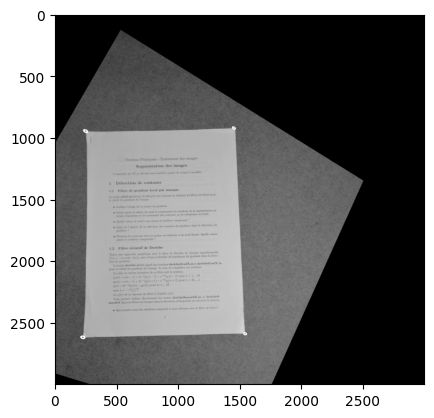

In [315]:
H = compute_homography(pts1,pts2)
homography_matrix_normalized = H
result = cv2.warpPerspective(img2, np.linalg.inv(homography_matrix_normalized),(3000,3000))
plt.imshow(result,cmap='gray')

**Réponse**

On remarque que l'algorithme DLT a bien fonctionné dans ce cas là (points séléctionnés manuellement donc sans bruit ni mauvaise correspondance) car on a réussi à appliquer la transformation pour modifier le document 2 dans la perspective du document 1.

**Question:** test the sensitivity of the above algorithm to errors in the matching keypoints. Are you able to obtain good results if you have a false match?

Answer to the same question is you have more matching points than the corners.

**Réponse**

On remarque que l'algorithme DLT es extrêmement sensible aux erreurs d'associations dans les points clés. Lorsque que l'on ajoute une fausse association, cela fausse complétement le résultat obtenu.

En ajoutant plus de bonnes associations de points, on obtient un résultat légérement plus robuste car une partie de la feuille est transformée à peu près au bon endroit mais ce n'est tout de même pas concluant car l'outlier influe énormément dans le résultat obtenu par le système de la matrice $A$.

[[248, 949], [1450, 924], [1541, 2592], [225, 2621], [1700, 200]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (10, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 1.61842511e-01  4.20881731e-01 -7.96378516e+02]
 [ 3.86526432e-01  6.36226071e-01 -9.94465592e+02]
 [ 3.72895399e-05  5.11973115e-04 -5.64998246e-01]]


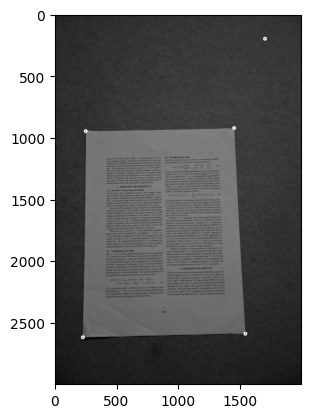

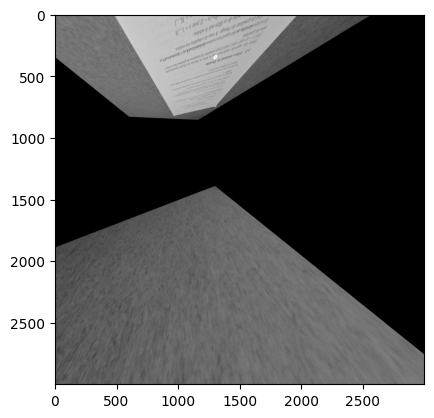

In [316]:
pts1 = pts1.T.tolist() + [[1700,200]]
pts2 = pts2.T.tolist() + [[1300,800]]


print(pts1)
for i in range(len(pts1)):
    img1c_dec=cv2.circle(img1,pts1[i],radius=10,color=(255,0,0),thickness=10)
plt.figure(),plt.imshow(img1c_dec,cmap='gray')

for i in range(len(pts2)):
    img2c_dec=cv2.circle(img2,pts2[i],radius=10,color=(255,0,0),thickness=10)
plt.figure(),plt.imshow(img2c_dec,cmap='gray')

pts1 = np.array(pts1).T # In all the following, we will use the convention that np.shape(pts1) = [2xnumber_of_points]
pts2 = np.array(pts2).T # In all the following, we will use the convention that np.shape(pts1) = [2xnumber_of_points

H = compute_homography(pts1,pts2)
homography_matrix_normalized = H / H[2, 2]
result = cv2.warpPerspective(img2, np.linalg.inv(homography_matrix_normalized),(3000,3000))
plt.imshow(result,cmap='gray')

[[248, 949], [1450, 924], [1541, 2592], [225, 2621], [1700, 200], [1700, 200], [880, 930], [1500, 1720], [900, 2600], [250, 1750]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (20, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 3.67359041e-02 -3.18678599e-01  2.98707549e+02]
 [-4.27927326e-01 -6.15843758e-01  1.03520514e+03]
 [ 5.99502484e-05 -4.43827436e-04  3.21894436e-01]]


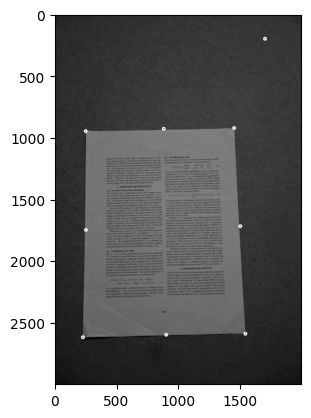

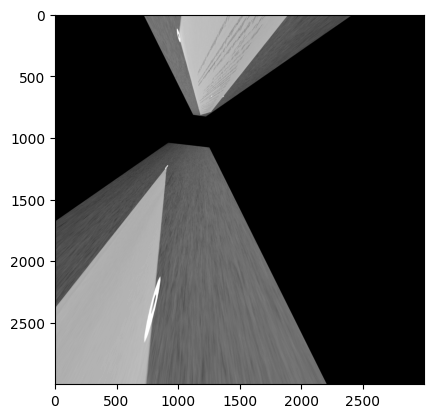

In [317]:
pts1 = pts1.T.tolist() + [[1700,200]] + [[880,930],[1500,1720],[900,2600],[250,1750]]
pts2 = pts2.T.tolist() + [[1300,800]] + [[2340,470],[1900,1250],[625,1120],[1270,370]]


print(pts1)
for i in range(len(pts1)):
    img1c_dec=cv2.circle(img1,pts1[i],radius=10,color=(255,0,0),thickness=10)
plt.figure(),plt.imshow(img1c_dec,cmap='gray')

for i in range(len(pts2)):
    img2c_dec=cv2.circle(img2,pts2[i],radius=10,color=(255,0,0),thickness=10)
plt.figure(),plt.imshow(img2c_dec,cmap='gray')

pts1 = np.array(pts1).T # In all the following, we will use the convention that np.shape(pts1) = [2xnumber_of_points]
pts2 = np.array(pts2).T # In all the following, we will use the convention that np.shape(pts1) = [2xnumber_of_points

H = compute_homography(pts1,pts2)
homography_matrix_normalized = H / H[2, 2]
result = cv2.warpPerspective(img2, np.linalg.inv(homography_matrix_normalized),(3000,3000))
plt.imshow(result,cmap='gray')

# Part 2: automatic homography estimation and panorama stitching

To bypass the flaws that we observed with the previous method, we now propose to use a robust homography estimation method, the RANSAC algorithm. As an application, we will consider panorama stitching: from two given overlapping images, create a single one which is a panorama. To do that, we will need to estimate the best homography to warp an image into the perspective of the other. In addition, to avoid the cumbersome choice of the matching points between the two images, we will do an automatic keypoint identification by using the SIFT features.

Let us first load the two considered images.

(<Figure size 640x480 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x21d899bc050>)

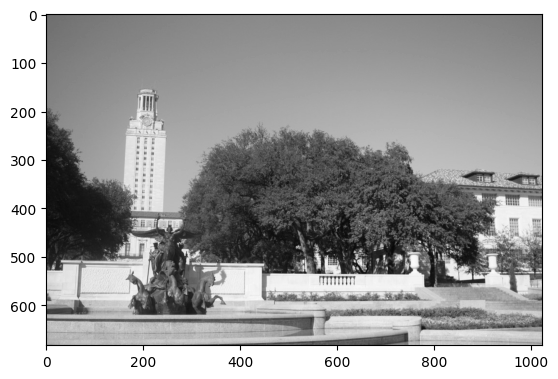

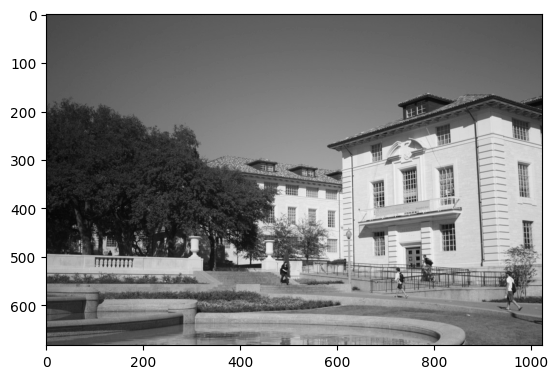

In [318]:
img1c = cv2.cvtColor(cv2.imread('uttower_left.jpg'),cv2.COLOR_BGR2GRAY)
img2c = cv2.cvtColor(cv2.imread('uttower_right.jpg'),cv2.COLOR_BGR2GRAY)

img1 = img1c
img2 = img2c

plt.figure(),plt.imshow(img1,cmap='gray')
plt.figure(),plt.imshow(img2,cmap='gray')

To stitch the two images, we need to have access to pair of corresponding points between image 1 and image 2. To do that, we first need to extract some keypoints in both images (that will be matched later on). We will use here the SIFT descriptors.

**Implement** the SIFT descriptors for both image 1 and image 2. You might be willing to use the cv2.SIFT_create and sift.detectAndCompute.

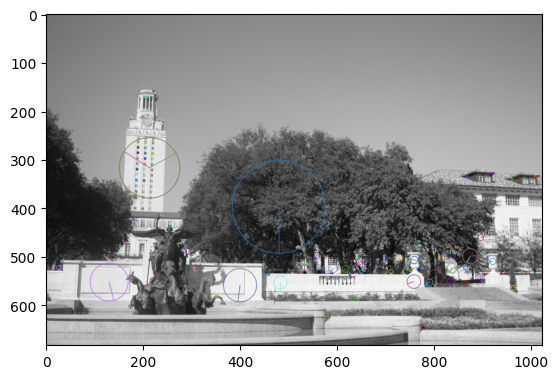

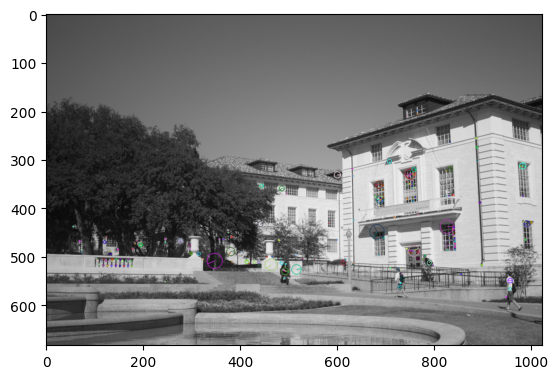

In [319]:
sift = cv2.SIFT_create(contrastThreshold=0.167) # Creates an object of the SIFT class. The larger the threshold, the smaller the number of points
kp1,desc1 = sift.detectAndCompute(img1, None) #kp1 = location of the keypoints, desc1 = corresponding descriptors.

# For visualization
img1c=cv2.drawKeypoints(img1,kp1,img1c,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(img1c)
plt.show()

kp2,desc2 = sift.detectAndCompute(img2, None) #kp2 = location of the keypoints, desc2 = corresponding descriptors.
img2c=cv2.drawKeypoints(img2,kp2,img2c,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(img2c)

In [336]:
print(f"desc1 shape : {desc1.shape}")
print(f"kp1 length : {len(kp1)}")
print(f"desc2 shape : {desc2.shape}")
print(f"kp2 length : {len(kp2)}")

desc1 shape : (306, 128)
kp1 length : 306
desc2 shape : (286, 128)
kp2 length : 286
< cv2.KeyPoint 0000021DDD10BD20>


**Question:** explain the shapes of desc1, kp1 and desc2, kp2 and their respective roles.

**Réponse**

kp1 et kp2 représentent l'ensemble des coordonnées points clés, ce sont des tuples d'objets cv2.KeyPoint de taille le nombre de points clés dans chaque image (306 dans la première et 286 dans la deuxième). desc1 et desc2 sont les descripteurs de ces points clés, la première dimension est le nombre de points clés dans l'image et la seconde est 128 car les descripteurs SIFT sont des histogrammes d'orientation de gradients à 8 bins dans 16 patchs autour du point clé.

Now that we have obtained the SIFT descriptor, we have to match them.

**Complete** the following code.

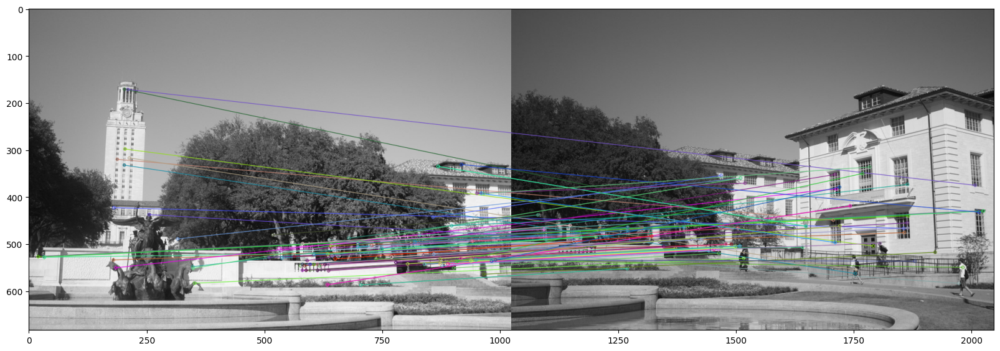

(<Figure size 2000x1200 with 1 Axes>,
 None)

In [320]:
#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(desc1,desc2) 


# For visualizing the matches
img3 = cv2.drawMatches(img1, kp1, img2, kp2, matches[:100], img2, flags=2)
plt.figure(figsize=(20,12)),plt.imshow(img3),plt.show()

**Question:** comment the match quality. Do you think that the previous matching would enable a decent homography computation using the DLT algorithm of the first part?

**Réponse**

La qualité des correspondances est assez faible, on remarque que la tour et la statue dans la première image ont plusieurs associations alors qu'ils ne sont pas présents dans la deuxième et inversement les personnes et le bâtiment de droite de la deuxième image ont des correspondances alors qu'ils ne sont pas présents dans la première image. Comme nous avons vu précédemment avec une seule mauvaise correspondance on obtenait un très mauvais résultat, ici elles ne sont pas faites à la main mais avec la correspondance SIFT qui est assez mauvaise pour notre threshold avec beaucoup d'outliers qui fausseraient complétement les résultats avec l'algorithme DLT. Il faut donc utiliser RANSAC qui utilise DLT de manière beaucoup plus robuste aux outliers.

The following code enables to keep only the coordinates of the 100 best matches in the two images. We will use them as an input of a RANSAC, which will enable to do a robust homography estimation between the two images.

In [321]:
D1 = np.ones((2,100)) # Coordinates in image 1 of the first best matching points
D2 = np.ones((2,100)) # Coordinates in image 2 of the first best matching points
for ii in range(100):
    D1[:,ii] = kp1[matches[ii].queryIdx].pt
    D2[:,ii] = kp2[matches[ii].trainIdx].pt

D1 = D1.astype(int)
D2 = D2.astype(int)

In [322]:
print(D1.shape)

(2, 100)


Now, we are ready to code the RANSAC algorithm.

**Fill** the gaps in the code below.

In [323]:
def ransac(D1, D2, num, threshold, iterations):
    # D1, D2 : matched points between the two images
    # num : number of points to compute the homography
    # threshold : distance threshold for determining if a pair of point in an inlier or an outlier
    # iterations : number of iterations / number of sampling
    
    D1h = np.ones((3, D1.shape[1])) #D1h correspond to D1 transformed into homogeneous coordinates
    D1h[0:2,:] = D1
    
    D2h = np.ones((3, D2.shape[1])) #D2h correspond to D2 transformed into homogeneous coordinates
    D2h[0:2,:] = D2
        
    n = D1.shape[1] # Number of points in D1
    

    best_n_inlier = 0
    best_H = np.zeros((3,3)) # Best homography matrix. Fill the gap with a matrix of the right size full of 0.
    
    for i in range(iterations):
        s = np.random.choice(n, num, replace=False) # Draw randomly 4 indices to extract 4 points among D1 and D2. You can use np.random.choice()
        
        pts1 =  D1[:, s] #pts1 is the chosen points among D1
        pts2 =  D2[:, s] #pts2 is the chosen points among D2
        
        H = compute_homography(pts1, pts2) # Compute the corresponding homography. You can reuse the function of part I.
        
        D2_new = np.dot(H, D1h) # Transform the points of D1h to be able to compare them to the ones of D2h
        
        # Normalize D2_new
        D2_new[0, :] = np.divide(D2_new[0, :],D2_new[2, :])
        D2_new[1, :] = np.divide(D2_new[1, :],D2_new[2, :])
        D2_new[2, :] = np.divide(D2_new[2, :],D2_new[2, :])
        
        
        
        SD = np.linalg.norm(D2h - D2_new,axis=0)# Compute the distance between D2_new and D2h
        
        inliers = (SD <= threshold) # Compute the inliers
        num_inlier = np.sum(inliers)# Compute the number of inliers
        
        if num_inlier > best_n_inlier: # If you obtained the best result, store the corresponding homography
            best_H = H
            best_n_inlier = num_inlier
            point1 = D1[:2, inliers]
            point2 = D2[:2, inliers]
            in_res = SD[inliers]
    
    
    return best_H, best_n_inlier, point1, point2, in_res

Using the function you implemented above, **launch the RANSAC algorithm** to estimate the homography between the two images.

In [345]:
threshold = 1;
num = 4;
iterations = 1000;
[H, inliers, point1, point2, residue] = ransac(D1, D2, num,threshold, iterations)

Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 8.96646653e-01 -2.56163360e+00  5.12707357e+02]
 [ 7.22024461e-01 -1.94796143e+00  3.46273513e+02]
 [ 1.58990660e-03 -4.20658091e-03  7.22733179e-01]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 4.72966134e-02  2.19469817e+00 -1.21695216e+03]
 [ 3.40768063e-02  2.04331759e+00 -1.11811627e+03]
 [ 6.57436662e-05  3.83613388e-03 -2.09897822e+00]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 6.

C:\Users\natha\AppData\Local\Temp\ipykernel_18424\624178697.py:30: RuntimeWarning: divide by zero encountered in divide
  D2_new[0, :] = np.divide(D2_new[0, :],D2_new[2, :])
C:\Users\natha\AppData\Local\Temp\ipykernel_18424\624178697.py:31: RuntimeWarning: invalid value encountered in divide
  D2_new[1, :] = np.divide(D2_new[1, :],D2_new[2, :])
C:\Users\natha\AppData\Local\Temp\ipykernel_18424\624178697.py:32: RuntimeWarning: invalid value encountered in divide
  D2_new[2, :] = np.divide(D2_new[2, :],D2_new[2, :])



Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[-4.17754194e-01 -1.54805133e+00  1.13415623e+03]
 [-6.56875799e-03 -2.10116989e-01  1.79973525e+02]
 [-1.79917615e-04 -8.11992954e-04  6.75098071e-01]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 2.68775952e+00 -3.88009216e+00  2.84912375e+02]
 [ 2.10691885e+00 -4.35136944e+00  8.48898210e+02]
 [ 4.48375534e-03 -8.28930198e-03  1.30652261e+00]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 8.68020779e-01  1.60396227e-02 -5.94658370e+02]
 [ 1.11221389e+00 -1.19756771e+00 -1.42479285e+02]
 [ 2.21527524e-03 -2.36

C:\Users\natha\AppData\Local\Temp\ipykernel_18424\624178697.py:30: RuntimeWarning: invalid value encountered in divide
  D2_new[0, :] = np.divide(D2_new[0, :],D2_new[2, :])


In [346]:
print(H)

[[ 6.46997008e-01 -6.16511717e-02 -2.72046829e+02]
 [ 8.51341687e-02  5.89096233e-01 -7.32430672e+01]
 [ 1.44301377e-04 -3.49023462e-05  5.20135946e-01]]


Lastly, **fill the code** below to warp img2 into the same space as img1

In [347]:
result = cv2.warpPerspective(img2, np.linalg.inv(H),(img1.shape[1] + img2.shape[1], img1.shape[0]))
result[0:img1.shape[0], 0:img1.shape[1]] = img1

**Question:** Plot the panorama image. How good is it? Any comment?

**Réponse**

La reconstitution du panorama est très bonne. L'algorithme RANSAC permet de trouver un sous ensemble de correspondances de points clés qui explique au mieux l'homographie entre les 2 images, ce qui permet de ne pas prendre en compte les mauvaises correspondances des points clés SIFT. La continuité entre les 2 images est très bonne. Cependant, on remarque un changement de luminosité entre les 2 images, qui n'est pas pris en compte par l'algorithme.

(<Figure size 4000x2000 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x21da884f680>)

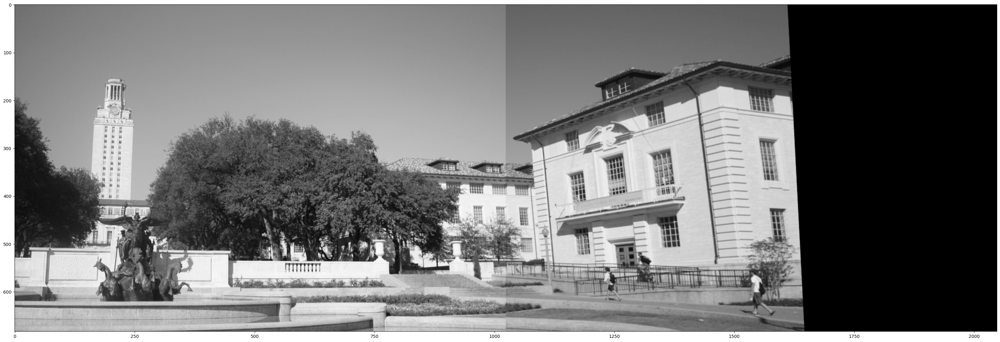

In [348]:
plt.figure(figsize=(40,20)),plt.imshow(result,cmap='gray')

**Bonus**: try other descriptors than the SIFT ones. Try to implement your own.

**Réponse**

On essaye avec les descripteurs BRISK qui sont invariants aux rotations et changements d'échelles tout en étant plus rapides à calculer et matcher que SIFT. On remarque que le panorama obtenu est meilleur, les images sont mieux alignées et on a moins de discontinuités.

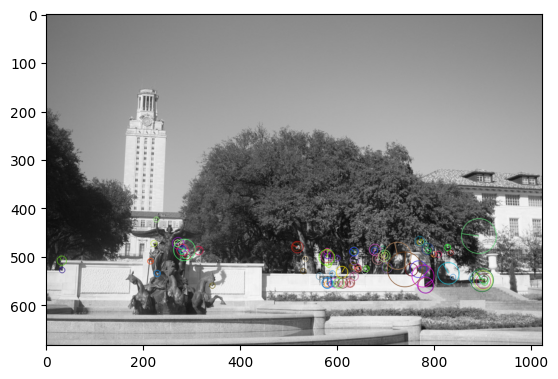

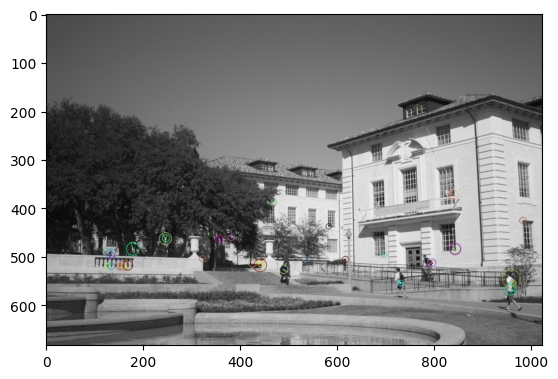

In [366]:
brisk = cv2.BRISK_create(thresh=140) # Creates an object of the BRISK class. The larger the threshold, the smaller the number of points
kp1,desc1 = brisk.detectAndCompute(img1, None) #kp1 = location of the keypoints, desc1 = corresponding descriptors.

# For visualization
img1c=cv2.drawKeypoints(img1,kp1,img1c,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(img1c)
plt.show()

kp2,desc2 = brisk.detectAndCompute(img2, None) #kp2 = location of the keypoints, desc2 = corresponding descriptors.
img2c=cv2.drawKeypoints(img2,kp2,img2c,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(img2c)

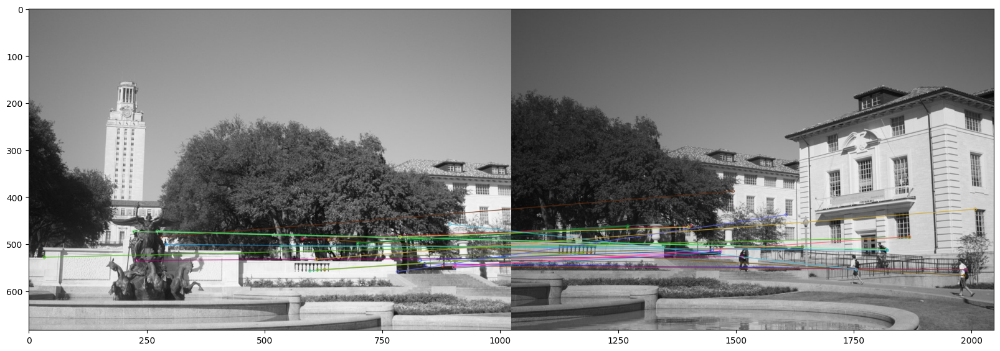

(<Figure size 2000x1200 with 1 Axes>,
 None)

In [367]:
#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(desc1,desc2) 


# For visualizing the matches
img3 = cv2.drawMatches(img1, kp1, img2, kp2, matches[:100], img2, flags=2)
plt.figure(figsize=(20,12)),plt.imshow(img3),plt.show()

Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[-1.74110403e-01  4.02899255e-01 -1.01175080e+02]
 [-2.82040703e-01  1.51340556e+00 -5.98241899e+02]
 [-5.92318653e-04  3.35410478e-03 -1.34658183e+00]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 1.87691752e-01 -2.14127916e-01 -4.08674406e+01]
 [ 6.32620303e-02 -1.66875584e+00  7.55906412e+02]
 [ 1.07640041e-04 -3.11046421e-03  1.40682843e+00]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 4.

(<Figure size 4000x2000 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x21dac88f740>)

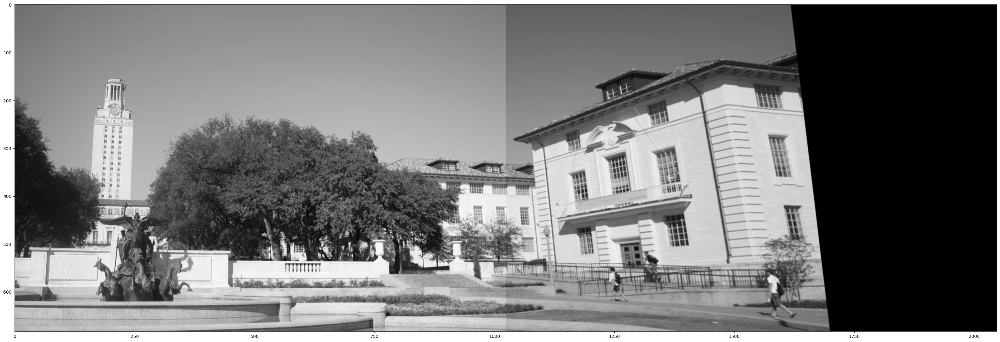

In [370]:
D1 = np.ones((2,len(matches))) # Coordinates in image 1 of the first best matching points
D2 = np.ones((2,len(matches))) # Coordinates in image 2 of the first best matching points
for ii in range(len(matches)):
    D1[:,ii] = kp1[matches[ii].queryIdx].pt
    D2[:,ii] = kp2[matches[ii].trainIdx].pt

D1 = D1.astype(int)
D2 = D2.astype(int)

threshold = 1;
num = 4;
iterations = 1000;
[H, inliers, point1, point2, residue] = ransac(D1, D2, num,threshold, iterations)

result = cv2.warpPerspective(img2, np.linalg.inv(H),(img1.shape[1] + img2.shape[1], img1.shape[0]))
result[0:img1.shape[0], 0:img1.shape[1]] = img1
plt.figure(figsize=(40,20)),plt.imshow(result,cmap='gray')

**Bonus:** try to correct the change of luminosity between the two images so that the panorama look more realistic.

**Réponse**

On applique une prescription d'histogrammes sur la première image pour avoir la même distribution d'histrogrammes entre les 2 images et donc avoir une limite moins marquée dans le panorama. Le résultat est meilleur que précédemment mais on voit toujours une légère discontinuité de luminosité dans le ciel.

Image 1


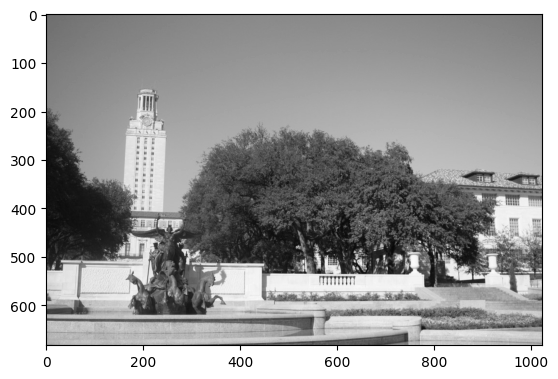

Image 2


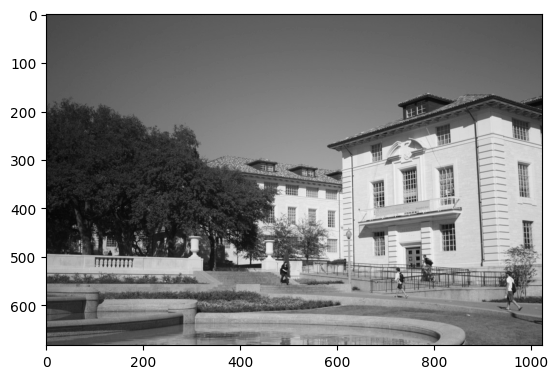

Image 1 prescripted


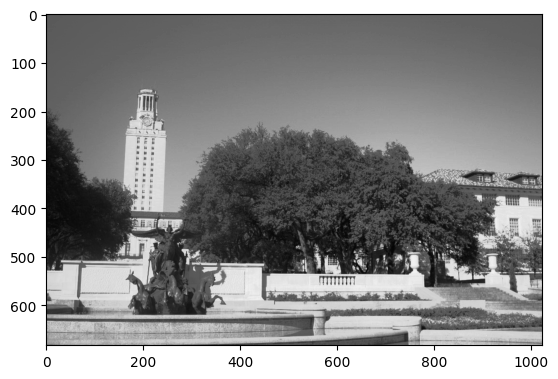

In [356]:
print('Image 1')
plt.imshow(img1,cmap='gray')
plt.show()
print('Image 2')
plt.imshow(img2,cmap='gray')
plt.show()

img1_shape = img1.shape
img1_flat = img1.ravel()
img2_flat = img2.ravel()

sorted_indices = np.argsort(img1_flat)
prescribed_img1 = np.zeros_like(img1_flat)
prescribed_img1[sorted_indices] = np.sort(img2_flat)
prescribed_img1 = prescribed_img1.reshape(img1_shape)

print('Image 1 prescripted')
plt.imshow(prescribed_img1,cmap='gray')
plt.show()


(<Figure size 4000x2000 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x21dac8cbb00>)

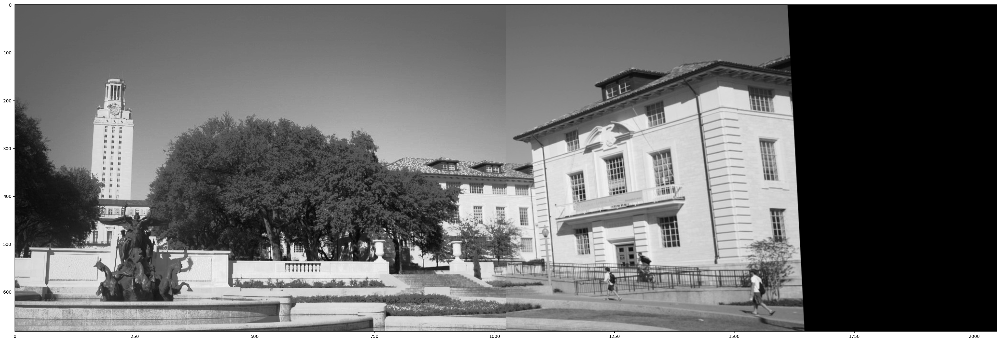

In [357]:
result_prescribed = cv2.warpPerspective(img2, np.linalg.inv(H),(prescribed_img1.shape[1] + img2.shape[1], prescribed_img1.shape[0]))
result_prescribed[0:prescribed_img1.shape[0], 0:prescribed_img1.shape[1]] = prescribed_img1
plt.figure(figsize=(40,20)),plt.imshow(result_prescribed,cmap='gray')